In [18]:
import numpyro
import numpyro.distributions as dist

import jax.numpy as jnp

numpyro.set_platform("cpu")
numpyro.set_host_device_count(10)

def neal_funnel(obs):
    x = numpyro.sample('x', dist.Normal(0,1))
    y = numpyro.sample('y', dist.Normal(0,jnp.exp(x)))
    return numpyro.sample('obs', dist.Bernoulli(ljnp.exp(4*x)),obs=obs)



from jax import random
from numpyro.infer import MCMC, NUTS 

from numpyro.handlers import reparam
from numpyro.infer.reparam import LocScaleReparam

nuts_kernel = NUTS(neal_funnel)

mcmc = MCMC(nuts_kernel, num_warmup=1000, num_samples=5000 ,num_chains=10)

rng_key = random.PRNGKey(0)

mcmc.run(rng_key, obs = 0, extra_fields=('num_steps',))

mcmc.print_summary()



reparam_model = reparam(neal_funnel, config={"x": LocScaleReparam(0),"y": LocScaleReparam(0)})

nuts_kernel2 = NUTS(reparam_model)

mcmc2 = MCMC(nuts_kernel2, num_warmup=1000, num_samples=5000 ,num_chains=10)

rng_key2 = random.PRNGKey(0)

mcmc2.run(rng_key, obs = 0, extra_fields=('num_steps',))


mcmc2.print_summary()

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]


                mean       std    median      5.0%     95.0%     n_eff     r_hat
         x      0.05      0.96      0.02     -1.58      1.55   2632.99      1.01
         y     -0.88      2.82     -0.16     -3.80      1.85   3035.07      1.00

Number of divergences: 1907


  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]


                    mean       std    median      5.0%     95.0%     n_eff     r_hat
  x_decentered      0.01      1.00      0.01     -1.67      1.63  20454.07      1.00
  y_decentered     -0.17      0.99     -0.21     -1.75      1.50  21570.33      1.00

Number of divergences: 49


In [14]:
from numpyro.infer import SVI, Trace_ELBO
from numpyro.infer.autoguide import AutoNormal
from numpyro.optim import Adam

optimizer = Adam(step_size = 0.005)

learnable_model = reparam(neal_funnel, config={"x": LocScaleReparam(),"y": LocScaleReparam()})

# setup the inference algorithm
svi = SVI(learnable_model, AutoNormal(learnable_model), optimizer, loss=Trace_ELBO())

# do gradient steps
svi_result = svi.run(random.PRNGKey(0), 40000, obs = 0)
params = svi_result.params

100%|██████████| 40000/40000 [00:21<00:00, 1858.05it/s, init loss: 7.4520, avg. loss [38001-40000]: 1.9649]


In [15]:
params

{'x_centered': DeviceArray(0.5, dtype=float32),
 'x_decentered_auto_loc': DeviceArray(-0.7887652, dtype=float32),
 'x_decentered_auto_scale': DeviceArray(0.23484026, dtype=float32),
 'y_centered': DeviceArray(7.757284e-06, dtype=float32),
 'y_decentered_auto_loc': DeviceArray(0.00961401, dtype=float32),
 'y_decentered_auto_scale': DeviceArray(0.06577644, dtype=float32)}

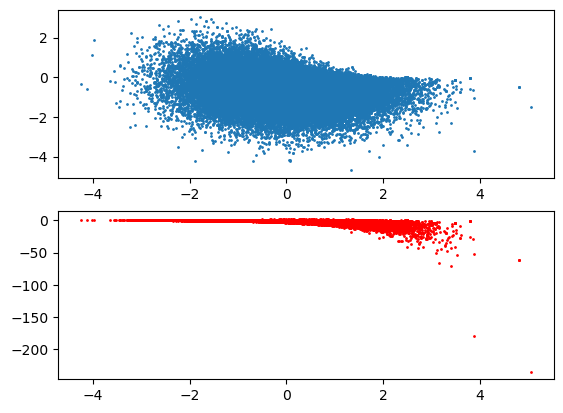

In [17]:
import matplotlib.pyplot as plt

ax = plt.subplot(2,1,1)
ax2 = plt.subplot(2,1,2)

samples = mcmc.get_samples()
samples2 = mcmc2.get_samples()

ax2.scatter(samples2["x"],samples2["y"], s = 1, c = "red")

ax.scatter(samples2["x_decentered"],samples2["y_decentered"], s = 1)


